New try with KMeans. Didn't solve it. Some text processing. Better processing in other notebooks. Nothing important in this notebook.

In [ ]:
import os
os.chdir(r"c:\Users\britt\Desktop\YH\Applicerad AI\job_discrimination")
import string

import matplotlib.pyplot as plt
import nltk
import pandas as pd
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

In [3]:
nltk.download("wordnet")

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\britt\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [5]:
def read_file(file_name):
    """
    This function will read the text files passed & return the list
    """
    with open(file_name, "r", encoding="utf-8") as f:
        words = f.read()
    return words

In [6]:
def text_process(text):
    '''
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Return the cleaned text as a list of words
    4. Remove words
    '''
    stemmer = WordNetLemmatizer()
    nopunc = [char for char in text if char not in string.punctuation]
    nopunc = ''.join([i for i in nopunc if not i.isdigit()])
    nopunc =  [word.lower() for word in nopunc.split() if word not in stopwords.words('english')]
    return [stemmer.lemmatize(word) for word in nopunc]

In [7]:
sample_text = "Hey There! This is a Sample review, which 123happens {blah}%456 to contain happened punctuations universal rights of right contained."
text_process(sample_text)

['hey',
 'there',
 'this',
 'sample',
 'review',
 'happens',
 'blah',
 'contain',
 'happened',
 'punctuation',
 'universal',
 'right',
 'right',
 'contained']

In [8]:
docs = []
for bulletin in os.listdir("data/cleaned_data/job_bulletins/unlabeled"):
    doc = read_file(f"data/cleaned_data/job_bulletins/unlabeled/{bulletin}").replace("\n", " ")
    words = text_process(doc)
    docs.append(words)

In [9]:
docs

[['accountant',
  'class',
  'code',
  'open',
  'date',
  'exam',
  'open',
  'all',
  'including',
  'current',
  'city',
  'employee',
  'annual',
  'salary',
  'note',
  'candidate',
  'eligible',
  'list',
  'normally',
  'appointed',
  'vacancy',
  'lower',
  'pay',
  'grade',
  'position',
  'for',
  'information',
  'regarding',
  'reciprocity',
  'city',
  'los',
  'angeles',
  'department',
  'ladwp',
  'go',
  'httpperlacityorgreciprocitycitydeptsanddwppdf',
  'annual',
  'salary',
  'start',
  'pay',
  'range',
  'the',
  'current',
  'salary',
  'range',
  'subject',
  'change',
  'please',
  'confirm',
  'starting',
  'salary',
  'hiring',
  'department',
  'accepting',
  'job',
  'offer',
  'duty',
  'an',
  'accountant',
  'professional',
  'accounting',
  'work',
  'analysis',
  'preparation',
  'maintenance',
  'control',
  'reconciliation',
  'financial',
  'record',
  'report',
  'accordance',
  'principle',
  'governmental',
  'public',
  'accounting',
  'requireme

In [10]:
flat_list = [item for sublist in docs for item in sublist]
flat_list

['accountant',
 'class',
 'code',
 'open',
 'date',
 'exam',
 'open',
 'all',
 'including',
 'current',
 'city',
 'employee',
 'annual',
 'salary',
 'note',
 'candidate',
 'eligible',
 'list',
 'normally',
 'appointed',
 'vacancy',
 'lower',
 'pay',
 'grade',
 'position',
 'for',
 'information',
 'regarding',
 'reciprocity',
 'city',
 'los',
 'angeles',
 'department',
 'ladwp',
 'go',
 'httpperlacityorgreciprocitycitydeptsanddwppdf',
 'annual',
 'salary',
 'start',
 'pay',
 'range',
 'the',
 'current',
 'salary',
 'range',
 'subject',
 'change',
 'please',
 'confirm',
 'starting',
 'salary',
 'hiring',
 'department',
 'accepting',
 'job',
 'offer',
 'duty',
 'an',
 'accountant',
 'professional',
 'accounting',
 'work',
 'analysis',
 'preparation',
 'maintenance',
 'control',
 'reconciliation',
 'financial',
 'record',
 'report',
 'accordance',
 'principle',
 'governmental',
 'public',
 'accounting',
 'requirementminimum',
 'qualification',
 'graduation',
 'accredited',
 'fouryear',
 'c

In [11]:
tf_idf_vectorizer = TfidfVectorizer(analyzer=text_process, ngram_range=(1, 3))

In [12]:
X = tf_idf_vectorizer.fit_transform(flat_list)
df_bow = pd.DataFrame(X.toarray(), columns=tf_idf_vectorizer.get_feature_names_out())

c:\Users\britt\Desktop\YH\Applicerad AI\job_discrimination\venv_job_discrimination\lib\site-packages\sklearn\feature_extraction\text.py:544: UserWarning: The parameter 'ngram_range' will not be used since 'analyzer' is callable'
  warnings.warn(


In [13]:
X

<420842x6397 sparse matrix of type '<class 'numpy.float64'>'
	with 401197 stored elements in Compressed Sparse Row format>

In [14]:
modelkmeans = KMeans(n_clusters=2, init='k-means++', n_init=100)
label = modelkmeans.fit_predict(X)

In [14]:
sum_of_squared_distances = []
K = range(1,150)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

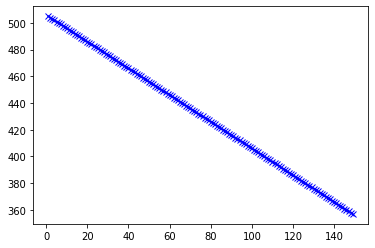

In [15]:
plt.plot(K, sum_of_squared_distances, 'bx-')
# plt.xlabel('k')
# plt.ylabel('Sum_of_squared_distances')
# plt.title('Elbow Method For Optimal k')
plt.show()

In [23]:
sum_of_squared_distances

[505.00000000000006,
 504.00000000000034,
 503.0,
 502.0000000000001,
 500.9999999999997,
 499.99999999999983,
 499.0,
 497.9999999999997,
 496.9999999999996,
 496.0000000000001,
 494.99999999999966,
 494.00000000000017,
 493.0000000000001,
 492.0,
 490.9999999999997,
 490.00000000000017,
 488.99999999999994,
 488.0,
 486.9999999999998,
 485.9999999999999,
 485.00000000000017,
 483.9999999999999,
 482.9999999999997,
 482.0000000000001,
 480.99999999999955,
 480.00000000000034,
 478.9999999999996,
 478.0000000000003,
 476.99999999999955,
 475.99999999999994,
 475.0000000000002,
 474.0000000000001,
 473.00000000000017,
 471.99999999999966,
 471.0000000000002,
 469.9999999999997,
 468.9999999999997,
 467.9999999999996,
 466.99999999999966,
 466.0000000000002,
 465.0,
 463.9999999999998,
 462.9999999999998,
 461.99999999999983,
 461.00000000000017,
 459.99999999999994,
 458.9999999999999,
 458.0000000000001,
 456.9999999999998,
 455.9999999999998,
 454.99999999999994,
 453.99999999999994,
